# **MG&G Datascience Tutorial**

<img src="WorldEarthquakeMap-1-1400x820.jpeg">

This tutorial is part of our Marine Geology and Geophysics day. It demonstrates how to do basic analysis and visualization of seafloor features, geologic, and seismic data. We will learn how to make maps of publicly available datasets of seafloor bathymetry, crustal age, and tectonic plate depth. We will then learn how to download data using python from the databases where seismic data are stored. Combining these techniques, we will learn to think like a geophysicist and use available data to draw connections between earthquake activity and geologic characteristics.

## **Tutorial Goals**


*   Python Skills
  *   List item
  *   List item


*   MG&G Knowledge
  *   Learn about how earth processes are derived from the bathymetry
  *   List item


### **Reading**

Yeats, R. S. (2004). Living with earthquakes in the Pacific Northwest. https://open.oregonstate.education/earthquakes/chapter/earthquakes-in-the-juan-de-fuca-plate/


Bilek, Susan L., Susan Y. Schwartz, and Heather R. DeShon. "Control of seafloor roughness on earthquake rupture behavior." Geology 31.5 (2003): 455-458.

https://pubs.geoscienceworld.org/gsa/geology/article/31/5/455/198278/Control-of-seafloor-roughness-on-earthquake

# **Environment set-up**

to be filled out with instructions for new environment set-up

In [224]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import xarray as xr  #loading and working with data in an optimal way.


import obspy
from obspy.clients.fdsn import Client

import plotly.express as px

import wget


import cartopy.crs as ccrs         # to plot maps with different projections
import cartopy.feature as cfeature # to plot coastlines, land, borders, etc.

from matplotlib.colors import LightSource


# Downloading earthquake data

The vast majority of seismic data is stored by IRIS, the *Incorporated Research Institutions for Seismology*.

IRIS stores seismometer waveform time series, seismometer station information, earthquake catalog data, and many, many, more seismic-related data products.

Much of the data we will be using today comes from IRIS, and we can download it remotely from this python notebook using the Number 1 package in seismology, obsPy!

obsPy connects to seismic databases using a client (see below). There are many other global clients but today we'll be connecting to IRIS. First, we are going to download earthquake data.

In [49]:
# Prepare to connect to the earthquake database, called IRIS
client = Client("IRIS")

In [50]:
# Specify what times you want the data for
t1 = obspy.UTCDateTime(2010,7,1)
t2 = obspy.UTCDateTime(2022,7,1)

# Specify the minimum magnitude earthquake you want
minmagnitude = 5

# Note - you can also specify minimum/maximum latitudes/longitudes to get the data for.
# But for now, we won't specify
minlat = None
maxlat = None
minlon = None
maxlon = None

# Query the database for earthquakes within your timeframe
cat = client.get_events(starttime = t1, 
                        endtime = t2,
                        minmagnitude=minmagnitude,
                        minlatitude=minlat,
                        minlongitude=minlon,
                        maxlatitude=maxlat,
                        maxlongitude=maxlon)

#### We now have a catalog object, which we see contains a number of earthquakes:

In [83]:
cat[1030].event_descriptions[0]

EventDescription(text='OFF COAST OF OREGON', type='Flinn-Engdahl region')

#### We see that we can access individual earthquakes in the catalog by indexing, and we see that they have origin and magnitude information:

In [174]:
N=123
print('Description', cat[N].event_descriptions[0].text)
print('Magnitude  ', cat[N].magnitudes[0].mag)
print('Time       ', cat[N].origins[0].time.datetime)
print('Depth      ', cat[N].origins[0].depth)
print('Longitude  ', cat[N].origins[0].longitude)
print('Latitude   ', cat[N].origins[0].latitude)

Description NORTHERN EAST PACIFIC RISE
Magnitude   5.4
Time        2022-05-27 18:22:42.182000
Depth       10000.0
Longitude   -102.9812
Latitude    8.4239


#### The time, location (lat, lon, depth), and magnitude information is of most interest to us. We can take this information for each earthquake and organize it more neatly into a tabular format as a pandas dataframe.

In [158]:
def catalog2pandas(cat): # Reorganize the Event Catalog into a pandas dataframe, keeping only the needed information
    
    times = [ev.origins[0].time.datetime for ev in cat]
    lats = [ev.origins[0].latitude for ev in cat]
    lons = [ev.origins[0].longitude for ev in cat]
    mags = [ev.magnitudes[0].mag for ev in cat]
    depths = [ev.origins[0].depth for ev in cat]
    
    descriptions=[ev.event_descriptions[0]['text'] for ev in cat]

    origin_dict = {'time':times,'latitude':lats,'longitude':lons,'depth':depths,'magnitude':mags, 'description':descriptions}

    events = pd.DataFrame.from_dict(origin_dict)
    
    events=events.sort_values(by='time'); 
    
    return events

In [176]:
events=catalog2pandas(cat)
events

,time,latitude,longitude,depth,magnitude,description
23474,2010-07-01 03:07:44.730,-21.7127,-174.8894,10000.0,5.0,TONGA ISLANDS
23473,2010-07-01 15:21:48.780,1.2175,97.1780,29500.0,5.1,"NORTHERN SUMATRA, INDONESIA"
23472,2010-07-01 16:57:49.010,-5.1534,129.3761,35000.0,5.8,BANDA SEA
23471,2010-07-01 20:58:24.250,-35.6997,-72.5314,40700.0,5.1,NEAR COAST OF CENTRAL CHILE
23470,2010-07-02 01:12:45.780,-14.5389,167.3002,205300.0,5.0,VANUATU ISLANDS
...,...,...,...,...,...,...
4,2022-06-28 15:52:13.191,-9.2047,123.6028,102860.0,5.0,TIMOR REGION
3,2022-06-29 06:05:51.925,44.4569,-28.2658,10000.0,5.0,NORTHERN MID-ATLANTIC RIDGE
2,2022-06-29 19:17:58.933,-58.4428,-26.2175,101660.0,5.3,SOUTH SANDWICH ISLANDS REGION
1,2022-06-30 05:21:17.204,-17.0429,-70.1237,153570.0,5.1,NEAR COAST OF PERU


# Interactive maps of global earthquakes

#### Now that we have our basic earthquake information, let's visualize where they are in the world! Here we'll make some cool interactive maps that you can access as an html product. To do so we will use the package called plotly.

#### Make a histogram of earthquake magnitudes

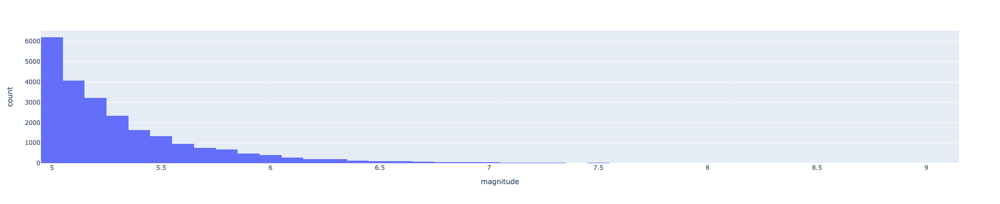

In [177]:
fig = px.histogram(events,   #specify what dataframe to use
             x="magnitude",  #specify the variable for the histogram 
             nbins=50,       #number of bins for the histogram 
             height=400,     #dimensions of the figure
             width=600);
fig.show()

#### Now make an animated map of the earth that iterates through time

Let's add the __year__ and __marker_size__ as new columns to our dataframe to help us visualize earthquakes on a geographic map

In [179]:
events['year'] = pd.DatetimeIndex(events['time']).year # add year as a category to group by
events['marker_size'] =np.fix(np.exp(events['magnitude'])) # add marker size as exp(mag)

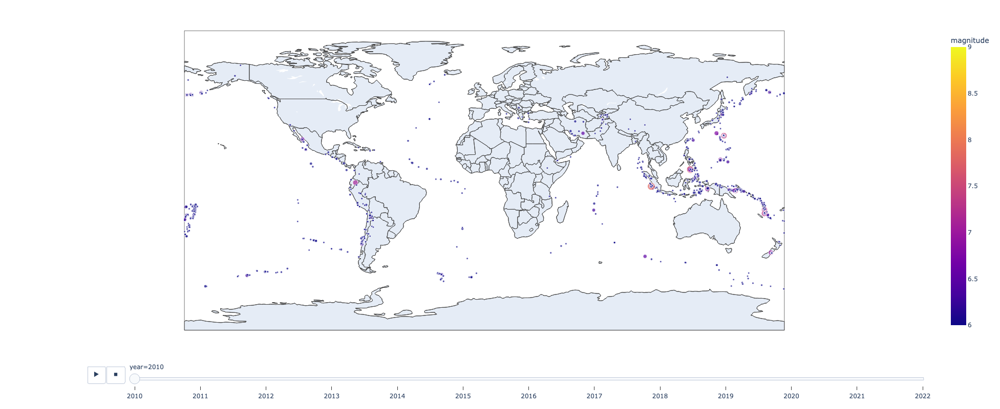

In [180]:
fig = px.scatter_geo(events[events.magnitude>5],
                     lat='latitude',lon='longitude', 
                     size='marker_size', color='magnitude',
                     hover_name='description', hover_data=['magnitude','depth'], 
                     range_color=(6,9),
                     height=800, width=1400,
                     animation_frame="year");
fig.update_geos(resolution=110, showcountries=True)

## In-class exercise
Use an Orthographic projection to look at earthquakes on a spinning globe

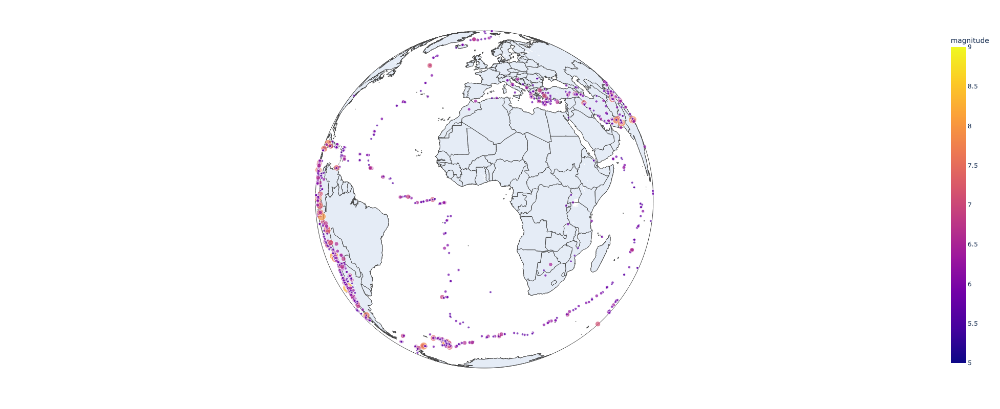

In [182]:
fig = px.scatter_geo(events[events.magnitude>5.5],
                     lat='latitude',lon='longitude', 
                     size='marker_size', color='magnitude',
                     hover_name='description', hover_data=['magnitude','depth','year'], 
                     range_color=(5,9),
                     height=800, width=1400)
fig.update_geos(resolution=50, showcountries=True, showlakes=True,projection_type='orthographic')
fig.show()
fig.write_html("EarthquakesMag6+.html") #save the figure as an html file to view it yourself or embed in your website!  

As you can see on the interactive maps, a particularly active location is an area off the coast of the northwest United States. To see why this might be, we can look at the topography of the seafloor in that area. We call seafloor topography data "bathymetry".


# Juan de Fuca plate
<img src="Juan de Fuca plate.jpeg" width=800>

# Detailed non-interactive maps

Let's zoom in on our location of interest and start to look at the bathymetry of the ocean floor at that location, to see it suggests a connection between the earthquake locations and seafloor features.

Bathymetry datasets are compiled from decades of ship-based seafloor mapping. Scientists work really hard to make this data available to the community. Marine geophysicists primarily get their bathymetry data from the GMRT dataset:

*"The Global Multi-Resolution Topography (GMRT) synthesis is a multi-resolutional compilation of edited multibeam sonar data collected by scientists and institutions worldwide, that is reviewed, processed and gridded by the GMRT Team and merged into a single continuously updated compilation of global elevation data"*


see https://www.gmrt.org/ for more information.

We can request it from the GMRT database by building a URL and then using a URL request.

In [278]:
# We build a URL which will automatically download a bathymetry grid to our specifications
url = 'https://www.gmrt.org/services/GridServer?north={maxlat}&west={minlon}&east={maxlon}&south={minlat}&layer=topo&format=netcdf&resolution=high' 

# Specify coordinates for the bathymetry grid we want
url=url.format(maxlat=50,
               minlon=-135,
               maxlon=-120,
               minlat=39)

print(url)

topo_data=wget.download(url)
print(fname)

https://www.gmrt.org/services/GridServer?north=50&west=-135&east=-120&south=39&layer=topo&format=netcdf&resolution=high
GMRTv4_0_20220724topo.grd


### Great, now we have our bathymetry grid but it's in a grid format: let's change it to a more convenient array format.

In [397]:
# Load the downloaded bathymetry data into xarray
topo=xr.open_dataset(topo_data)
dim=np.flip(topo.dimension).values
z=topo.z.values
z=z.reshape(dim)
z[np.isnan(z)]=0;

x=np.linspace(topo.x_range[0],topo.x_range[1],dim[1])
y=np.linspace(topo.y_range[1],topo.y_range[0],dim[0])

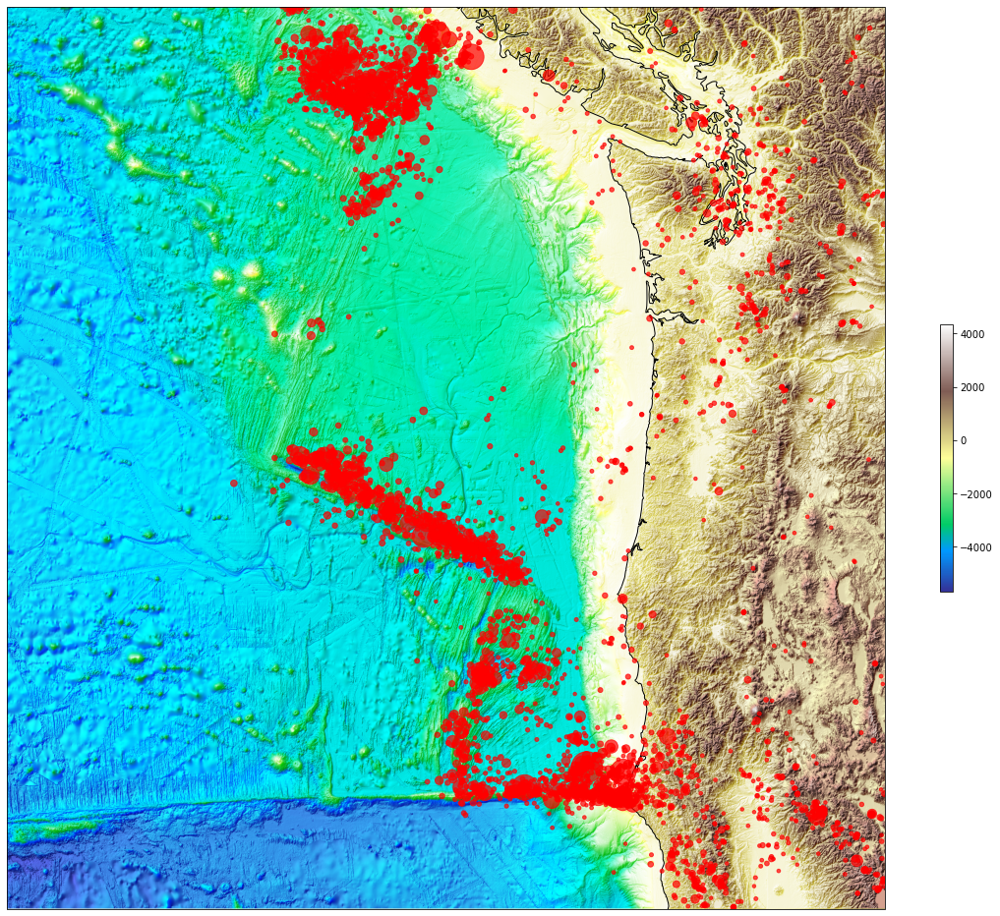

In [441]:
cmap = plt.get_cmap('terrain')

ls = LightSource(azdeg=315, altdeg=45)
rgb = ls.shade(z, cmap=cmap,blend_mode='overlay',vert_exag=0.1)

aspect=1/np.cos(np.pi/180*np.mean(y));  # aspect ratio = 1 degree lat in km over 1degree lon in km = 1/cos(lat)

plt.figure(figsize=(20,20))
ax = plt.axes(projection=ccrs.PlateCarree())
cax=plt.imshow(rgb, 
               cmap=cmap,
               vmin=np.max(z), vmax=np.min(z),
               extent=[min(x),max(x),min(y),max(y)], 
               aspect=aspect)
plt.colorbar(cax, shrink =0.25)
ax.add_feature(cfeature.COASTLINE)
ind= (events.longitude>min(x)) & (events.longitude<max(x)) & (events.latitude>min(y)) & (events.latitude<max(y))
plt.scatter(events[ind].longitude,events[ind].latitude,events[ind].marker_size, color='r',alpha=0.7)

Do any features in the bathymetry stand out to you?

Let's see how our earthquake locations (which we previously saved as "lats" and "lons" arrays) relate to bathymetry.

We can see there aren't too many large earthquakes occurring throughout the whole region. To get a better sense of the full scope of activity, we should plot smaller earthquakes.

# IN-CLASS EXERCISE NUMBER 1: 
Download earthquakes with a minimum magnitude of 2.5 for the chosen region from IRIS. Plot those earthquakes on the bathymetry map, with their size relating to magnitude.

## DO THIS IN FUNCTIONS

In [422]:
# Specify the same coordinates as for the bathymetry grid
minlat = 39
maxlat = 50
minlon = -135
maxlon = -120

t1 = obspy.UTCDateTime(2010,1,1)
t2 = obspy.UTCDateTime(2020,1,1)

minmagnitude=2.5

# Query the database for earthquakes within your timeframe
cat = client.get_events(starttime = t1, endtime = t2,
                        minmagnitude=minmagnitude,
                        minlatitude=minlat,
                        minlongitude=minlon,
                        maxlatitude=maxlat,
                        maxlongitude=maxlon)
events=catalog2pandas(cat)
events['year'] = pd.DatetimeIndex(events['time']).year # add year as a category to group by
events['marker_size'] =np.fix(np.exp(events['magnitude'])) # add marker size as exp(mag)

,time,latitude,longitude,depth,magnitude,description,year,marker_size
4600,2010-01-02 16:36:45.370,45.1429,-120.9314,17800.0,2.80,WASHINGTON-OREGON BORDER REGION,2010,16.0
4599,2010-01-02 22:33:10.880,49.4505,-127.5225,10000.0,3.00,"VANCOUVER ISLAND, CANADA REGION",2010,20.0
4598,2010-01-03 07:34:26.910,48.9040,-129.3231,10000.0,3.30,"VANCOUVER ISLAND, CANADA REGION",2010,27.0
4597,2010-01-04 08:33:01.090,48.8670,-129.4683,10000.0,3.30,"VANCOUVER ISLAND, CANADA REGION",2010,27.0
4596,2010-01-04 14:24:51.730,40.2743,-123.8909,12900.0,4.30,NORTHERN CALIFORNIA,2010,73.0
...,...,...,...,...,...,...,...,...
4,2019-12-28 11:03:48.430,42.0190,-126.1281,10000.0,4.50,OFF COAST OF OREGON,2019,90.0
3,2019-12-28 15:36:41.136,43.2887,-126.7253,10000.0,2.90,OFF COAST OF OREGON,2019,18.0
2,2019-12-28 20:07:32.641,42.0142,-126.1697,10000.0,2.70,OFF COAST OF OREGON,2019,14.0
1,2019-12-30 02:26:09.790,40.4610,-124.7205,24740.0,2.66,NEAR COAST OF NORTHERN CALIF.,2019,14.0


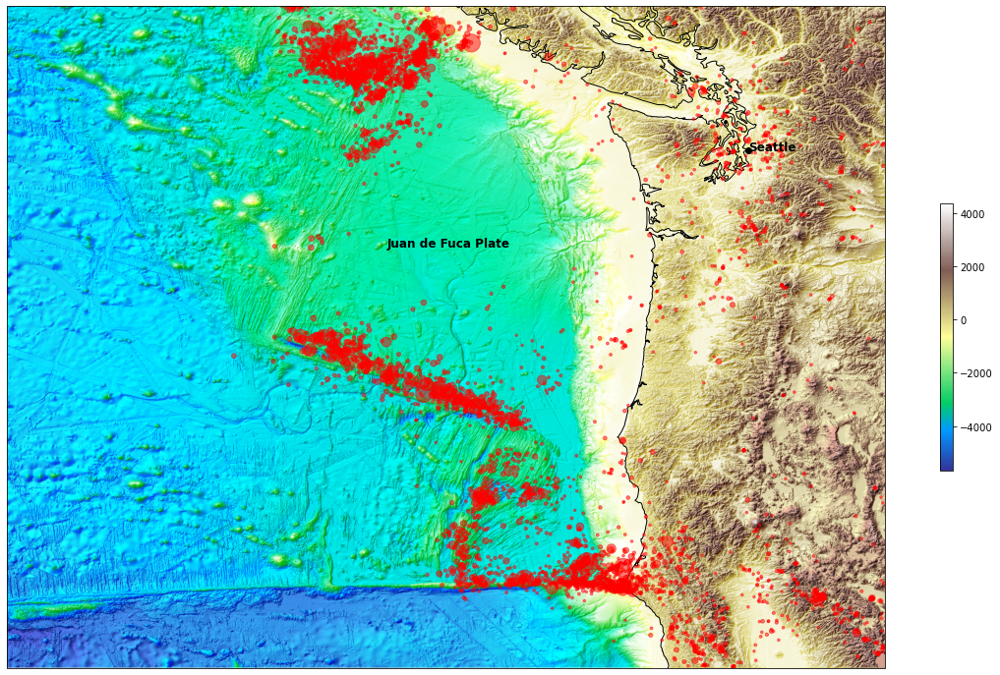

In [438]:
rgb = ls.shade(z, cmap=cmap,blend_mode='overlay',vert_exag=0.1)

plt.figure(figsize=(20,20))
ax = plt.axes(projection=ccrs.PlateCarree())
cax=plt.imshow(rgb, 
               cmap=cmap,
               vmin=np.max(z), vmax=np.min(z),
               extent=[min(x),max(x),min(y),max(y)], 
               aspect=aspect)
plt.colorbar(cax, shrink =0.25)
ax.add_feature(cfeature.COASTLINE)


ind= (events.longitude>min(x)) & (events.longitude<max(x)) & (events.latitude>min(y)) & (events.latitude<max(y))
plt.scatter(events[ind].longitude,events[ind].latitude,events[ind].marker_size/2, color='r',alpha=0.5)

plt.text(-128.5,46,'Juan de Fuca Plate',weight='semibold', fontsize=12)

Lat_Seattle=47.6062; Lon_Seattle=-122.3321
plt.plot(Lon_Seattle,Lat_Seattle, marker='o',color='k')
plt.text(Lon_Seattle,Lat_Seattle,'Seattle', fontsize=12, weight='bold')

plt.savefig('Juan de Fuca - Earthquakes.png')

We see that many of the earthquakes align with the bathymetric high that runs roughly north-south in the region. That is called the Juan de Fuca Ridge... (add paper here)

Could also note how there's nothing on Axial Seamount.. but it's super active just can't be observed by global seismometers because earthquakes are too small...

# In-class exercise: Earthquakes and Slab Depth

Slab2 data is stored at https://www.sciencebase.gov/catalog/item/5aa1b00ee4b0b1c392e86467/

1) Plot the earthquake location on top of the slab depth data.
2) Data co-location: for each earthquake, find the closest location of the slab depth as save it in the event database 
3) See if the slab depth and earthquake depths are correlated for different magnitude of earthquakes. 



In [126]:
slab_data = 'alu_slab2_dep_02.23.18.grd'

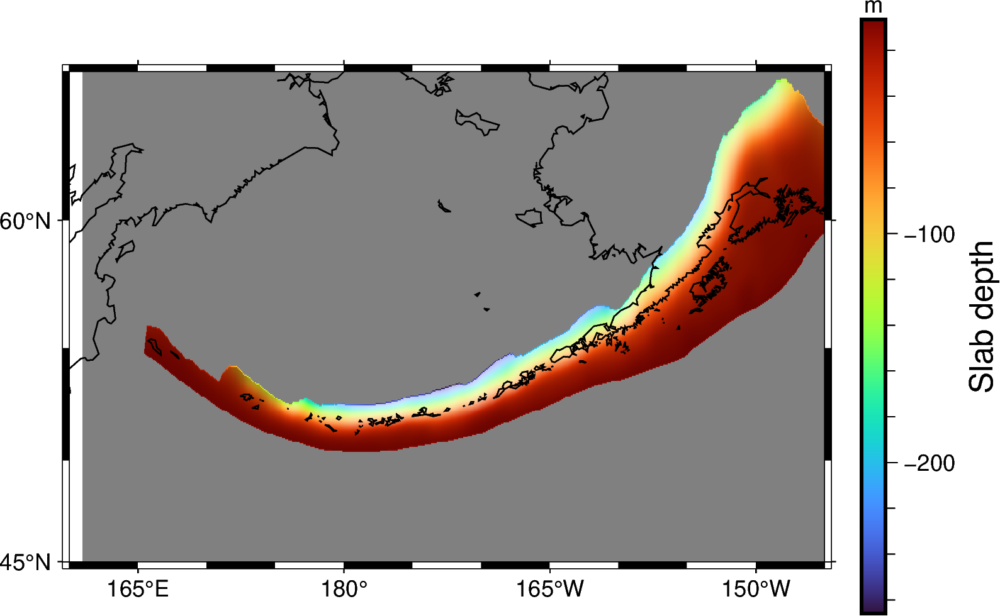

In [164]:
minlat = 45
maxlat = 65
minlon = -200 # note- this is not best practice to put longitude as greater than 180 but pyGMT requires it
maxlon = -145


fig = pygmt.Figure()
fig.grdimage(
    grid=slab_data,
    region=[minlon, maxlon, minlat, maxlat],
    projection='M4i',
    shading=True,
    frame=True
    )
fig.coast(shorelines="1/0.5p")

# Add a colorbar
fig.colorbar(frame=["x+lSlab depth", "y+lm"],position="JMR+o0.5c/0c+w8c")


fig.show()

In [141]:
minmagnitude = 4

minlat = 45
maxlat = 65
minlon = -180 
maxlon = -145

# Get earthquakes for this region
t1 = obspy.UTCDateTime(2015,1,1)
t2 = obspy.UTCDateTime(2021,1,1)

cat = client.get_events(starttime = t1, endtime = t2,minmagnitude=minmagnitude,minlatitude=minlat,minlongitude=minlon,maxlatitude=maxlat,maxlongitude=maxlon)


In [142]:
# This returns an earthquake catalog object, which we can reorganize into a pandas dataframe
times = [ev.origins[0].time.datetime for ev in cat]
lats = [ev.origins[0].latitude for ev in cat]
lons = [ev.origins[0].longitude for ev in cat]
mags = [ev.magnitudes[0].mag for ev in cat]
depths = [ev.origins[0].depth for ev in cat]

origin_dict = {'time':times,'latitude':lats,'longitude':lons,'depth':depths,'magnitude':mags}

events = pd.DataFrame.from_dict(origin_dict)
events['time'] = [str(t) for t in events['time']]
events.head()

,time,latitude,longitude,depth,magnitude
0,2020-12-30 14:04:00.862000,54.6708,-159.7624,29460.0,4.2
1,2020-12-30 03:22:18.334000,54.6660,-159.6861,27340.0,4.5
2,2020-12-30 03:17:52.301000,50.1709,-176.8200,10000.0,4.0
3,2020-12-29 09:41:35.775000,55.8848,-149.7875,10000.0,4.5
4,2020-12-28 18:15:50.954000,52.7556,-168.3297,39230.0,4.2


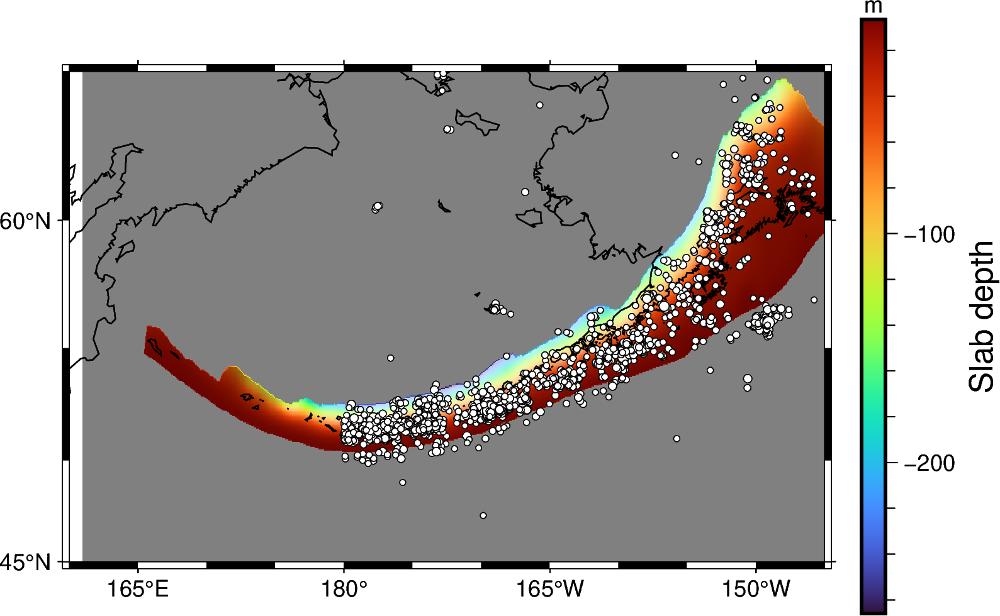

In [165]:

fig.plot(
    x=lons,
    y=lats,
    size=0.02 * np.array(mags),# (np.array(depths)/1000),
    style="cc",
    color="white",
    pen="black",
)
fig.show()

# Take-home exercise: plot the ocean floor age data and think about what it means.